<a href="https://colab.research.google.com/github/Rmohanty385/Netflix-Movies-and-TV-Shows-Clustering/blob/main/Netflix_Movies_and_TV_Shows_Clustering.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Project Name**    -  Netflix Movies and TV Shows Clustering



##### **Project Type**    - Unsupervised
##### **Contribution**    - Individual


# **Project Summary -**

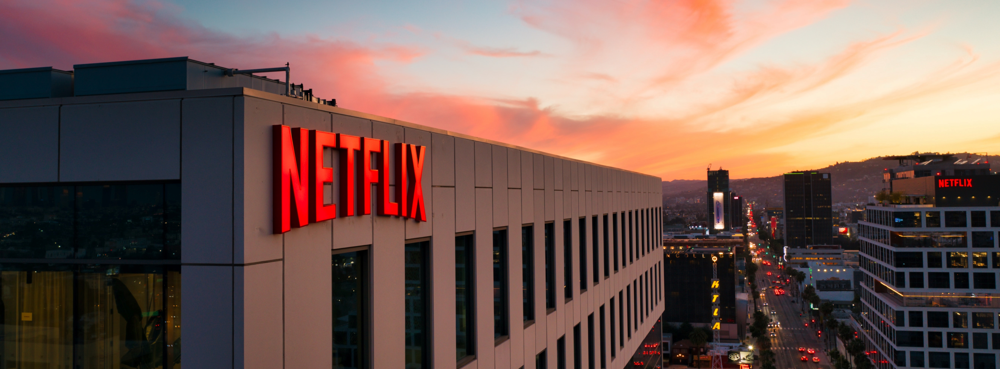

*   Netflix, is an American subscription streaming service and production company. It was founded in 1997 by Reed Hastings and Marc Randolph in Scott’s Valley, California.

*   It offers a library of films and television series through distribution deals as well as its own productions, known as Netflix Originals.

*   Our objective is to conduct an Exploratory Data Analysis to understand what content is available in different countries and if Netflix has been increasingly focusing on TV rather than movies in recent years. And use these insights to cluster similar content by matching text-based features.

*   After loading the data, we start by observing the first and last five values to understand the dataset. Next, we treat the null values by dropping them if the respective variables contain <1% of null values. This is followed by feature engineering to extract new variables from the datetime variable date_added.

*   This cleaned data is then used to conduct EDA in order to understand it better and identify the underlying trends.

*   Once obtained the required insights from the EDA, we start with Pre-processing the text data by removing the punctuation, and, stop words. This filtered data is passed through TF - IDF Vectorizer since we are conducting a text-based clustering and the model needs the data to be vectorized in order to predict the desired results.

*   Finally, K–Means clustering is utilized to form 10 distinct clusters with similar data points.

*   Using the data provided, we also implemented a simple recommender system that successfully generates Ten similar Movies or Tv-Shows for the given title.


# **GitHub Link -**

https://github.com/Rmohanty385/Netflix-Movies-and-TV-Shows-Clustering

# **Problem Statement**


This dataset consists of tv shows and movies available on Netflix as of 2021. The dataset is collected from Flixable which is a third-party Netflix search engine.

In 2018, they released an interesting report which shows that the number of TV shows on Netflix has nearly tripled since 2010. The streaming service’s number of movies has decreased by more than 2,000 titles since 2010, while its number of TV shows has nearly tripled. It will be interesting to explore what all other insights can be obtained from the same dataset.

*   Integrating this dataset with other external datasets such as IMDB ratings, rotten tomatoes can also provide many interesting findings.

*   In this project, you are required to do Exploratory Data Analysis.

*   Understanding what type content is available in different countries.

*   Is Netflix has increasingly focusing on TV rather than movies in recent years.

*   Clustering similar content by matching text-based features.


# **General Guidelines** : -  

1.   Well-structured, formatted, and commented code is required. 
2.   Exception Handling, Production Grade Code & Deployment Ready Code will be a plus. Those students will be awarded some additional credits. 
     
     The additional credits will have advantages over other students during Star Student selection.
       
             [ Note: - Deployment Ready Code is defined as, the whole .ipynb notebook should be executable in one go
                       without a single error logged. ]

3.   Each and every logic should have proper comments.
4. You may add as many number of charts you want. Make Sure for each and every chart the following format should be answered.
        

```
# Chart visualization code
```
            

*   Why did you pick the specific chart?
*   What is/are the insight(s) found from the chart?
* Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

5. You have to create at least 15 logical & meaningful charts having important insights.


[ Hints : - Do the Vizualization in  a structured way while following "UBM" Rule. 

U - Univariate Analysis,

B - Bivariate Analysis (Numerical - Categorical, Numerical - Numerical, Categorical - Categorical)

M - Multivariate Analysis
 ]





6. You may add more ml algorithms for model creation. Make sure for each and every algorithm, the following format should be answered.


*   Explain the ML Model used and it's performance using Evaluation metric Score Chart.


*   Cross- Validation & Hyperparameter Tuning

*   Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

*   Explain each evaluation metric's indication towards business and the business impact pf the ML model used.




















# ***Let's Begin !***

## ***1. Know Your Data***

### Import Libraries

In [ ]:
# Import Libraries and modules

# libraries that are used for analysis and visualization
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from wordcloud import WordCloud, STOPWORDS ,ImageColorGenerator
import re, string, unicodedata

# libraries used to process textual data
import string
string.punctuation
import nltk
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('omw-1.4')
from nltk.corpus import stopwords
from nltk.stem.snowball import SnowballStemmer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import PCA
import missingno as msno
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize
nltk.download('punkt')
from nltk.tokenize import TweetTokenizer

import datetime as dt

# libraries used to implement clusters
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.cluster import AgglomerativeClustering
import scipy.cluster.hierarchy as shc

# libraries that are used to construct a recommendation system
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity


# Library of warnings would assist in ignoring warnings issued
import warnings;warnings.filterwarnings("ignore")
import warnings;warnings.simplefilter('ignore')
#import stats 
from scipy import stats
     

### Dataset Loading

In [ ]:
# Load Dataset
df = pd.read_csv('/content/NETFLIX MOVIES AND TV SHOWS CLUSTERING.csv')

### Dataset First View

In [ ]:
# Dataset First Look
df.head()

### Dataset Rows & Columns count

In [ ]:
# Dataset Rows & Columns count
rows=df.shape[0]
columns=df.shape[1]
print(f"The no of rows is {rows} and no of columns is {columns}")

### Dataset Information

In [ ]:
# Dataset Info
df.info()

#### Duplicate Values

In [ ]:
# Dataset Duplicate Value Count
print(f'The number of duplicate rows are {df.duplicated().sum()}')

#### Missing Values/Null Values

In [ ]:
# Missing Values/Null Values Count
df.isna().sum()

In [ ]:
# Visualizing the missing values
plt.figure(figsize=(14, 5))
sns.heatmap(df.isnull(), cbar=True, yticklabels=False)
plt.xlabel("column_name", size=14, weight="bold")
plt.title("missing values in column",fontweight="bold",size=17)
plt.show()

### What did you know about your dataset?

*   There are 7787 rows and 12 columns in the dataset. In the director, cast, country, date_added, and rating columns, there are missing values. The dataset does not contain any duplicate values.

*   Every row of information we have relates to a specific movie. Therefore, we are unable to use any method to impute any null values. Additionally, due to the small size of the data, we do not want to lose any data, so after analyzing each column, we simply impute numeric values using an empty string in the following procedure.


## ***2. Understanding Your Variables***

In [ ]:
# Dataset Columns
df.columns

In [ ]:
# Dataset Describe
df.describe(include='all')

### Variables Description 

**show_id :** Unique ID for every Movie / Tv Show

**type :** Identifier - A Movie or TV Show

**title :** Title of the Movie / Tv Show

**director :** Director of the Movie

**cast :** Actors involved in the movie / show

**country :** Country where the movie / show was produced

**date_added :** Date it was added on Netflix

**release_year :** Actual Releaseyear of the movie / show

**rating :** TV Rating of the movie / show

**duration :** Total Duration - in minutes or number of seasons

**listed_in :** Genere

**description :** The Summary description

### Check Unique Values for each variable.

In [ ]:
# Check Unique Values for each variable.
for i in df.columns.tolist():
  print("No. of unique values in ",i,"is",df[i].nunique(),".")

## 3. ***Data Wrangling***

### Data Wrangling Code

In [ ]:
# Write your code to make your dataset analysis ready.
# Top countries
df.country.value_counts()

In [ ]:
# Genre of shows
df.listed_in.value_counts()

In [ ]:
# Changing the values in the rating column
rating_map = {'TV-MA':'Adults',
              'R':'Adults',
              'PG-13':'Teens',
              'TV-14':'Young Adults',
              'TV-PG':'Older Kids',
              'NR':'Adults',
              'TV-G':'Kids',
              'TV-Y':'Kids',
              'TV-Y7':'Older Kids',
              'PG':'Older Kids',
              'G':'Kids',
              'NC-17':'Adults',
              'TV-Y7-FV':'Older Kids',
              'UR':'Adults'}

df['rating'].replace(rating_map,inplace = True)
df['rating'].unique()

In [ ]:
# Handling the missing values

# The missing values in the director, cast, and country attributes can be replaced with 'Unknown'
df[['director','cast','country']] = df[['director','cast','country']].fillna('Unknown')

# The missing values in rating can be imputed with its mode, since this attribute is discrete.
df['rating'].fillna(value=df['rating'].mode()[0],inplace=True)

In [ ]:
# Choosing the primary country and primary genre to simplify the analysis
df['country'] = df['country'].apply(lambda x: x.split(',')[0])
df['listed_in'] = df['listed_in'].apply(lambda x: x.split(',')[0])

In [ ]:
# contry in which a movie was produced
df.country.value_counts()

In [ ]:
# genre of shows
df.listed_in.value_counts()

In [ ]:
# Splitting the duration column, and changing the datatype to integer
df['duration'] = df['duration'].apply(lambda x: int(x.split()[0]))

In [ ]:
# Number of seasons for tv shows
df[df['type']=='TV Show'].duration.value_counts()

In [ ]:
# Movie length in minutes
df[df['type']=='Movie'].duration.unique()

In [ ]:
# datatype of duration
df.duration.dtype

In [ ]:
# Converting 'date_added' from string to datetime
df["date_added"] = pd.to_datetime(df['date_added'])

In [ ]:
# first and last date on which a show was added on Netflix
df.date_added.min(),df.date_added.max()

In [ ]:
# Adding new attributes month_added & year_added from date_added column
df['month_added'] = df['date_added'].dt.month
df['year_added'] = df['date_added'].dt.year

# Drop date_added column
df.drop('date_added', axis=1, inplace=True)

In [ ]:
# New Dataset Rows & Columns 
df.shape

In [ ]:
# Dataset Info
df.info()

### What all manipulations have you done and insights you found?

*   There are some movies / TV shows that were filmed in multiple countries, have multiple genres associated with it.
*   To simplify the analysis, let's consider only the primary country where that respective movie / TV show was filmed. Also, let's consider only the primary genre of the respective movie / TV show and changed datatype.
*   The shows were added on Netflix between 1st January 2008 and 16th January 2021.
*   Now our dataset is completely ready for EDA.


## ***4. Data Vizualization, Storytelling & Experimenting with charts : Understand the relationships between variables***

#### Chart - 1 : Type (Univariate)

In [ ]:
# Chart - 1 visualization code
df['type'].value_counts()

#countplot to visualize the number of movies and tv_shows in type column
sns.countplot(df['type'])
plt.show()

##### 1. Why did you pick the specific chart?

*   Countplot show the frequency, counts of values for the different levels of a categorical or nominal variable.

*   To show the count of TV Show and Movie, I have used Countplot.


##### 2. What is/are the insight(s) found from the chart?

Netflix has 5377 movies and 2400 TV shows, there are more number movies on Netflix than TV shows.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

*   No, the gained insights help a positive business impact.

*   No, there are no such insights that lead to negative growth.


#### Chart - 2 : Director

In [ ]:
# Chart - 2 visualization code
# Top 10 directors in the dataset
plt.figure(figsize=(15,6))
df[~(df['director']=='Unknown')].director.value_counts().nlargest(10).plot(kind='bar')
plt.title('Top 10 directors by number of shows directed')

##### 1. Why did you pick the specific chart?

A barplot (or barchart) is one of the most common types of graphic. It shows the relationship between a numeric and a categoric variable.

##### 2. What is/are the insight(s) found from the chart?

*   Raul Campos and Jan Suter together have directed 18 movies / TV shows, which is higher than anyone in the top 10 director in dataset.
*   Ryan polito & david dhawan have lowest no of directed movies / TV shows which is 8 & 9 respectively in top 10 director dataset.



##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

*   No, the gained insights didn't create a positive business impact.
*   No, there are no such insights that lead to negative growth.


#### Chart - 3 : Release year of TV Shows/movies

In [ ]:
# Chart - 3 visualization code
#Analysing how many movies released per year in last 20 years
movies_year =df['release_year'].value_counts().sort_index(ascending=False)
movies_year[:20]
plt.figure(figsize=(15,5))
sns.countplot(y=df['release_year'],data=df,order=df['release_year'].value_counts().index[0:20])
plt.show()


##### 1. Why did you pick the specific chart?

*   Countplot show the frequency, counts of values for the different levels of a categorical or nominal variable.

*   To show the count of release year of Tv show /movies, I have used Countplot.


##### 2. What is/are the insight(s) found from the chart?

*   highest number of Tv show /movies released in 2017 and 2018.

*   We saw a huge increase in the number of Tv show /movies after 2015.


##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

*   No, the gained insights didn't create a positive business impact.
*   No, there are no such insights that lead to negative growth.

#### Chart - 4 :  Country

In [ ]:
# Chart - 4 visualization code
# Top 10 countries with the highest number movies / TV shows in the dataset
plt.figure(figsize=(15,5))
df[~(df['country']=='Unknown')].country.value_counts().nlargest(10).plot(kind='barh')
plt.title(' Top 10 countries with the highest number of shows')

In [ ]:
# % share of movies / tv shows by top 3 countries
df.country.value_counts().nlargest(3).sum()/len(df)*100

In [ ]:
# % share of movies / tv shows by top 10 countries
df.country.value_counts().nlargest(10).sum()/len(df)*100

##### 1. Why did you pick the specific chart?

A barplot (or barchart) is one of the most common types of graphic. It shows the relationship between a numeric and a categoric variable.

##### 2. What is/are the insight(s) found from the chart?

*   United States are the top one country of highest number of movies / TV shows in the dataset and then after India & United Kingdom are 2 & 3 Number in dataset

*   Mexico & Australia have 9 & 10 position in Top 10 countries with the highest number of movies / TV shows in the dataset.

*   The top 3 countries together account for about 56% of all movies and TV shows in the dataset.

*   Where the top ten countries together account for about 78% of all movies and TV shows in the dataset.


##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

*   No, the gained insights didn't create a positive business impact.

*   No, there are no such insights that lead to negative growth.


#### Chart - 5 : Release month

In [ ]:
df.head()

In [ ]:
# Chart - 5 visualization code
# Plotting the Countplot 
plt.figure(figsize=(12,10))
ax=sns.countplot(df['month_added'],data= df)
plt.show()

##### 1. Why did you pick the specific chart?

*   Countplot show the frequency, counts of values for the different levels of a categorical or nominal variable.

*   To show the count of month , I have used Countplot.


##### 2. What is/are the insight(s) found from the chart?

From October to January, maximum number of movies and TV shows were added.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

*   No, the gained insights didn't create a positive business impact.

*   No, there are no such insights that lead to negative growth.


#### Chart - 6 : Age

In [ ]:
# Chart - 6 visualization code
# Age ratings for shows in the dataset
plt.figure(figsize=(13,5))
sns.countplot(x='rating',data=df)
plt.xlabel('Different Age Groups',fontsize=12)
plt.ylabel('Number of Shows',fontsize=12)
plt.title('Number of shows on Netflix for different age groups')

##### 1. Why did you pick the specific chart?

countplot() method is used to Show the counts of observations in each categorical bin using bars.

##### 2. What is/are the insight(s) found from the chart?

*   Adults are the highest number of shows and second highest is Young Adults and third highest is older Kids shows.
*   Teens and kids are less number of shows on netflix as compare to other.


##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

*   Yes, the gained insights didn't create a positive business impact.

*   No, there are no such insights that lead to negative growth.


#### Chart - 7 : Genre

In [ ]:
# Chart - 7 visualization code
# Top 10 genres 
plt.figure(figsize=(13,5))
df.listed_in.value_counts().nlargest(10).plot(kind='bar')
plt.ylabel('Number of Shows',fontsize=12)
plt.title('Top 10 genres')

##### 1. Why did you pick the specific chart?

A barplot (or barchart) is one of the most common types of graphic. It shows the relationship between a numeric and a categoric variable.

##### 2. What is/are the insight(s) found from the chart?

*   The dramas is the most popular genres then comedies genres is second highest and documentries is third highest.

*   Genres of stand up comedy and horror movies are ninth and tenth highest in dataset.


##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

*   Yes, the gained insights didn't create a positive business impact.

*   No, there are no such insights that lead to negative growth.

#### Chart - 8 : Actors

In [ ]:
# Chart - 8 visualization code
# seperating actor from cast column
cast =df[~(df['cast']=='Unknown')].cast.str.split(', ', expand=True).stack().reset_index(level=1, drop=True)
plt.figure(figsize=(13,5))
cast.value_counts().nlargest(10).plot(kind='bar')
plt.ylabel('Number of Shows',fontsize=12)
plt.title('Top 10 Actors')

##### 1. Why did you pick the specific chart?

A barplot (or barchart) is one of the most common types of graphic. It shows the relationship between a numeric and a categoric variable.

##### 2. What is/are the insight(s) found from the chart?

*   Anupam kher play highest role in movie/show where shah rukh khan play secong highest role in movie/show.
*   Paresh rawal, yuki kaji play ninth & tenth highest role in movie/show.



##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

*   Yes, the gained insights didn't create a positive business impact.

*   No, there are no such insights that lead to negative growth.

#### Chart - 9 : movies and TV shows added over the years (Bivariate)

In [ ]:
# Chart - 9 visualization code

# Number of movies and TV shows added over the years
plt.figure(figsize=(20,6))
p = sns.countplot(x='year_added',data=df, hue='type')
plt.xlabel('Adding Years',fontsize=12)
plt.ylabel('Number of Shows',fontsize=12)
plt.title('Number of movies and TV shows added over the years')
for i in p.patches:
  p.annotate(format(i.get_height(), '.0f'), (i.get_x() + i.get_width() / 2., i.get_height()), ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')

##### 1. Why did you pick the specific chart?

countplot() method is used to Show the counts of observations in each categorical bin using bars.

##### 2. What is/are the insight(s) found from the chart?

*   Most of the years have more movies adding as compare to TV shows in Netflix.
*   Also Over the last few years from 2015 to 2021 Netflix has consistently focused on adding more shows in its platform.


##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

*  Yes, the gained insights didn't create a positive business impact.

*  No, there are no such insights that lead to negative growth.

#### Chart - 10 : Number of shows since 2008

In [ ]:
# Chart - 10 visualization code
# Number of shows released each year since 2008
order = range(2008,2022)
plt.figure(figsize=(15,7))
p = sns.countplot(x='release_year',data=df, hue='type',
                  order = order)
plt.xlabel('Release Years',fontsize=12)
plt.ylabel('Number of Shows',fontsize=12)
plt.title('Number of shows released each year since 2008 that are on Netflix')

for i in p.patches:
  p.annotate(format(i.get_height(), '.0f'), (i.get_x() + i.get_width() / 2., i.get_height()), ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')

##### 1. Why did you pick the specific chart?

countplot() method is used to Show the counts of observations in each categorical bin using bars.

##### 2. What is/are the insight(s) found from the chart?

*   From 2008 to 2018 Number of releaing Movies & TV Shows gradually increasing in each year.

*   from year 2008 to 2019 movies releasing is higher compare to TV shows.

*   Where year of 2017 & 2018 have highest number of releasing movies which is 744 & 734 respectively.

*   Where year of 2019 & 2020 have highest number of releasing TV Show which is 414 and 457 respectively


##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.



*   No, the gained insights didn't create a positive business impact.
*   No, there are no such insights that lead to negative growth.


#### Chart - 11 : Number of seasons per TV show

In [ ]:
# Chart - 11 visualization code
# Seasons in each TV show
plt.figure(figsize=(15,7))
p = sns.countplot(x='duration',data=df[df['type']=='TV Show'])
plt.xlabel('Number of Seasons',fontsize=12)
plt.ylabel('Number of Shows',fontsize=12)
plt.title('Number of seasons per TV show distribution')

##### 1. Why did you pick the specific chart?

A count plot can be thought of as a histogram across a categorical, instead of quantitative, variable. The basic API and options are identical to those for barplot() , so you can compare counts across nested variables.

##### 2. What is/are the insight(s) found from the chart?

*   Total season of tv shows is upto 16.

*   Most of the season of tv shows is one This might mean that the majority of TV shows has only recently begun, and that further seasons are on the way.

*   There are very few TV shows that have more than 8 seasons.


##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

*   No, the gained insights didn't create a positive business impact.

*   No, there are no such insights that lead to negative growth.

#### Chart - 12 : Length distribution of movies

In [ ]:
# Chart - 12 visualization code
# Length distribution of movies
movie_df = df[df['type']=='Movie']

plt.figure(figsize=(15, 7))

sns.distplot(movie_df['duration'], bins=30,color='Blue').set(ylabel=None)

plt.title('Length distribution of movies', fontsize=16,fontweight="bold")
plt.xlabel('Duration', fontsize=14)
plt.show()

##### 1. Why did you pick the specific chart?

We use a displot (also known as a distribution plot) to represent data in histogram form. It is a univariant set of collected data, which means the data distribution of one variable will be shown against another variable and it represents the overall distribution of continuous data variables.

##### 2. What is/are the insight(s) found from the chart?

*   The length of a movie may range from 3 min to 312 minutes.
*   Most of the movie length between 50 to 150 min and there are very less movies hows length is above 200 min hence the distribution is almost normally distributed.


##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

*   Yes, the gained insights didn't create a positive business impact.

*   No, there are no such insights that lead to negative growth.

#### Chart - 13 : Actors for TV Shows

In [ ]:
# Chart - 13 visualization code
# Top actors for TV Shows
plt.figure(figsize=(15,6))
df[~(df['cast']=='Unknown') & (df['type']=='TV Show')].cast.value_counts().nlargest(10).plot(kind='barh')
plt.xlabel('Number of TV Shows',fontsize=12)
plt.ylabel('Actor Name For TV Shows',fontsize=12)
plt.title('Actors who have appeared in highest number of TV Shows')

##### 1. Why did you pick the specific chart?

A horizontal bar plot is a plot that presents quantitative data with rectangular bars with lengths proportional to the values that they represent. A bar plot shows comparisons among discrete categories. One axis of the plot shows the specific categories being compared, and the other axis represents a measured value.

##### 2. What is/are the insight(s) found from the chart?

*   David Attenborough has appeared in 13 TV shows, followed by Michela Luci, Jamie Watson, Anna Claire Bartlam, Dante Zee, Eric Peterson with 4 TV shows.
*   Remaining actors from third to tenth position have equally appeared 2 Tv Shows.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

*   No, the gained insights didn't create a positive business impact.

*   No, there are no such insights that lead to negative growth.


#### Chart - 14 - Correlation Heatmap

In [ ]:
# Correlation Heatmap visualization code
plt.figure(figsize=(13,10))
sns.heatmap(df.corr(method='kendall'), cmap="YlGnBu", annot=True,vmin=-1,vmax=1)
plt.title('Heatmap for Netflix')

##### 1. Why did you pick the specific chart?

*   A correlation matrix is a table showing correlation coefficients between variables. Each cell in the table shows the correlation between two variables. *   A correlation matrix is used to summarize data, as an input into a more advanced analysis, and as a diagnostic for advanced analyses. The range of correlation is [-1,1].

*   Thus to know the correlation between all the variables along with the correlation coeficients, i used correlation heatmap.

##### 2. What is/are the insight(s) found from the chart?

There is no strong correlation found in the data. still we can se release year and duration are negatively correlated. That means, recent movies and got shorter in duration. which is also true.


#### Chart - 15 - Pair Plot 

In [ ]:
# Pair Plot visualization code
# Commenting this code because it take too much time to run
sns.pairplot(df)
plt.title('Relation between each variables',fontsize=20)
plt.show()


##### 1. Why did you pick the specific chart?

*   Pair plot is used to understand the best set of features to explain a relationship between two variables or to form the most separated clusters.

*   Thus, I used pair plot to analyse the patterns of data and realationship between the features. It's exactly same as the correlation map but here you will get the graphical representation.

##### 2. What is/are the insight(s) found from the chart?

Here, we can see that the release year is left skewed and month is normally distributed.

#### Chart - 16 - Wordcloud


In [ ]:
# Building a wordcloud for the movie descriptions
comment_words = ''
stopwords = set(STOPWORDS)

# iterate through the csv file
for val in df.description.values:
    
    # typecaste each val to string
    val = str(val)

    # split the value
    tokens = val.split()
    
    # Converts each token into lowercase
    for i in range(len(tokens)):
        tokens[i] = tokens[i].lower()
    
    comment_words += " ".join(tokens)+" "

wordcloud = WordCloud(width = 700, height = 700,
                background_color ='white',
                stopwords = stopwords,
                min_font_size = 10).generate(comment_words)


# plot the WordCloud image                      
plt.figure(figsize = (10,5), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)

##### 1. Why did you pick the specific chart?

Word clouds or tag clouds are graphical representations of word frequency that give greater prominence to words that appear more frequently in a source text. The larger the word in the visual the more common the word was in the document(s).

##### 2. What is/are the insight(s) found from the chart?

Some keywords that come in many times in Netflix show descriptions: life, family, find, new, love, young, world, group, death, man, woman, murder, son, girl, documentary, secret.

## ***5. Hypothesis Testing***

### Based on your chart experiments, define three hypothetical statements from the dataset. In the next three questions, perform hypothesis testing to obtain final conclusion about the statements through your code and statistical testing.

*   Movies rating for kids and older kids are at least two hours long.
*   The duration which is more than 90 minutes are movies.

In [ ]:
#Calculation of mean and std
def meanandstd(A,B):
  #mean and std. calutation for a and b variables
  M1 = A.mean()
  S1 = A.std()

  M2= B.mean()
  S2 = B.std()

  return (M1,S1,M2,S2)

In [ ]:
#Calculation of t-value
def findtvalue(A,B,M1,S1,M2,S2):
  #length of groups and DOF
  n1 = len(A)
  n2= len(B)

  dof = n1+n2-2

  sp_2 = ((n2-1)*S1**2  + (n1-1)*S2**2) / dof

  sp = np.sqrt(sp_2)

  #tvalue
  t_val = (M1-M2)/(sp * np.sqrt(1/n1 + 1/n2))
  
  return(dof,t_val)

In [ ]:
#making copy of df_clean_frame
df_hypothesis=df.copy()
#head of df_hypothesis
df_hypothesis.head()

### Hypothetical Statement - 1

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

HO:movies rated for kids and older kids are at least two hours long.

H1:movies rated for kids and older kids are not at least two hours long.


#### 2. Perform an appropriate statistical test.

In [ ]:
#filtering movie from Type_of_show column
df_hypothesis1 = df_hypothesis[df_hypothesis["type"] == "Movie"]

In [ ]:
#let's see unique target ages 
df_hypothesis1['rating'].unique()

In [ ]:
#Another category is target_ages (4 classes).
df_hypothesis1['rating'] = pd.Categorical(df_hypothesis1['rating'], categories=['Kids', 'Older Kids', 'Teens', 'Adults'])
#from duration feature extractin string part and after extracting Changing the object type to numeric
df_hypothesis1['duration']= df_hypothesis['duration'].astype(str).str.extract('(\d+)')
df_hypothesis1['duration'] = pd.to_numeric(df_hypothesis1['duration'])
#head of df_
df_hypothesis1.head(3)

In [ ]:
#group_by duration and rating                 
group_by_= df_hypothesis1[['duration','rating']].groupby(by='rating')
#mean of group_by variable
group=group_by_.mean().reset_index()
group

In [ ]:
df.head()

In [ ]:
#In A and B variable grouping values 
A= group_by_.get_group('Kids')
B= group_by_.get_group('Older Kids')

In [ ]:
# Perform Statistical Test

#Getting mean and std
M1,S1,M2,S2 = meanandstd(A,B)

#Getting t-value
dof,t_value = findtvalue(A,B,M1,S1,M2,S2)
print('-----'*6+f'\nt-value\n'+'-----'*6)
print(t_value)
print('====='*6)


#t-distribution
print('-----'*6+f'\nt-distribution\n'+'-----'*6)
print(stats.t.ppf(0.05,dof))
print(stats.t.ppf(0.95,dof))

##### Which statistical test have you done to obtain P-Value?

*   Because the t-value is not in the range, the null hypothesis is rejected.

*   As a result, movies rated for kids and older kids are not at least two hours long.


##### Why did you choose the specific statistical test?

Here , we use t-test instead of z-test because in a t-test is primarily used for research with limited sample sizes whereas a z-test is deployed for hypothesis testing that requires researchers to look at a population size that's larger than 30.

### Hypothetical Statement - 2

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

HO:The duration which is more than 90 mins are NOT movies.

H1:The duration which is more than 90 mins are movies.

#### 2. Perform an appropriate statistical test.

In [ ]:
df_hypothesis['duration']= df_hypothesis['duration'].astype(str).str.extract('(\d+)')
df_hypothesis['duration'] = pd.to_numeric(df_hypothesis['duration'])

In [ ]:
df_hypothesis['type'] = pd.Categorical(df_hypothesis['type'], categories=['Movie','TV Show'])
#head of df_
df_hypothesis.head(3)

In [ ]:
#group_by duration and TYPE                 
group_by_= df_hypothesis[['duration','type']].groupby(by='type')
#mean of group_by variable
group=group_by_.mean().reset_index()
group

In [ ]:
#In A and B variable grouping values 
A= group_by_.get_group('Movie')
B= group_by_.get_group('TV Show')

In [ ]:
# Perform Statistical Test

#Getting mean and std
M1,S1,M2,S2 = meanandstd(A,B)

#Getting t-value
dof,t_value = findtvalue(A,B,M1,S1,M2,S2)
print('-----'*6+f'\nt-value\n'+'-----'*6)
print(t_value)
print('====='*6)


#t-distribution
print('-----'*6+f'\nt-distribution\n'+'-----'*6)
print(stats.t.ppf(0.05,dof))
print(stats.t.ppf(0.95,dof))

##### Which statistical test have you done to obtain P-Value?

*   Because the t-value is not in the range, the null hypothesis is rejected.

*   As a result, The duration which is more than 90 mins are movies.



##### Why did you choose the specific statistical test?

Here , we use t-test instead of z-test because in a t-test is primarily used for research with limited sample sizes whereas a z-test is deployed for hypothesis testing that requires researchers to look at a population size that's larger than 30.

## ***6. Feature Engineering & Data Pre-processing***

### 1. Handling Missing Values

In [ ]:
# Handling Missing Values & Missing Value Imputation
# Missing Values/Null Values Count
print(df.isnull().sum())

#### What all missing value imputation techniques have you used and why did you use those techniques?

There are no missing values to handle in the given dataset.

### 2. Handling Outliers

Not Needed.

### 3. Textual Data Preprocessing 
(It's mandatory for textual dataset i.e., NLP, Sentiment Analysis, Text Clustering etc.)

Text pre-processing is the process of preparing text data so that machines can use the same to perform tasks like analysis, predictions, etc. There are different steps in text pre-processing like - removing stopwords and punctuations , stemming of words etc. Let us start the preprocessing task.

#### 1. Expand Contraction

In [ ]:
df_cluster = df.copy()
# Expand Contraction
# Combining all the clustering attributes into a single column

df_cluster['clustering'] = (df_cluster['director'] + ' ' + 
                                df_cluster['cast'] +' ' + 
                                df_cluster['country'] +' ' + 
                                df_cluster['listed_in'] +' ' + 
                                df_cluster['description'])

In [ ]:
# Select the 100 number of clusters for the dataset 
df_cluster['clustering'][7782]

#### 2. Lower Casing

In [ ]:
# Lower Casing
# we will convert all words in lowercase
df_cluster['clustering'] = df_cluster['clustering'].str.lower()

In [ ]:
# Select the 100 number of clusters for the dataset 
df_cluster['clustering'][7782]

#### 3. Removing Punctuations

We need to carefully choose the list of punctuation which we are going to discard based on the use case.To remove punctuation let's create a function and apply them on our variables

In [ ]:
# Remove Punctuations
def remove_punct(text):
  ''' a function for removing punctuation'''
  import string
    # replacing the punctuations with no space, 
    # which in effect deletes the punctuation marks
  translator=str.maketrans('','',string.punctuation)
    # return the text stripped of punctuation marks
  return text.translate(translator)

In [ ]:
#applying function
df_cluster['clustering'] = df_cluster['clustering'].apply(remove_punct)
df_cluster['clustering'][7782]

#### 4. Removing URLs & Removing words and digits contain digits.

In [ ]:
# Remove URLs & Remove words and digits contain digits
# function to remove non-ascii characters

def remove_non_ascii(words):
    """Function to remove non-ASCII characters"""
    new_words = []
    for word in words:
        new_word = unicodedata.normalize('NFKD', word).encode('ascii', 'ignore').decode('utf-8', 'ignore')
        new_words.append(new_word)
    return new_words

In [ ]:
# remove non-ascii characters
df_cluster['clustering']= remove_non_ascii(df_cluster['clustering'])

In [ ]:
# Select the 100 number of clusters for the dataset 
df_cluster['clustering'][0]

#### 5. Removing Stopwords & Removing White spaces

With english, among many popular languages, stop words are common words within sentences that do not add value and thus can be eliminated when cleaning for NLP prior to analysis.We will make good use of the NLTK library by importing the pre-programmed english stop words library.

In [ ]:
# extracting the stopwords from nltk library
import nltk
nltk.download('stopwords')

from nltk.corpus import stopwords

sw = stopwords.words('english')
np.array(sw)

In [ ]:
# Remove Stopwords

def remove_stopwords(text):
  '''a function for removing the stopword'''
  # removing the stop words and lowercasing the selected words
  text=[word.lower() for word in text.split() if word not in sw]
  # joining the list of words with space separator
  return ' '.join(text)

In [ ]:
# Remove White spaces
#applying function
df_cluster['clustering'] = df_cluster['clustering'].apply(remove_stopwords)
df_cluster['clustering'][7782]

#### 6. Text Normalization

In [ ]:
# Normalizing Text (i.e., Stemming, Lemmatization etc.)
# function to lemmatize the corpus
def lemmatize_verbs(words):
    """Lemmatize verbs in list of tokenized words"""
    lemmatizer = WordNetLemmatizer()
    lemmas = []
    for word in words:
        lemma = lemmatizer.lemmatize(word, pos='v')
        lemmas.append(lemma)
    return lemmas

In [ ]:
# Lemmatization
df_cluster['clustering'] = lemmatize_verbs(df_cluster['clustering'])

In [ ]:
# Select the 100 number of clusters for the dataset 
df_cluster['clustering'][0]

##### Which text normalization technique have you used and why?

Stemming is the process of producing morphological variants of a root/base word. Stemming programs are commonly referred to as stemming algorithms or stemmers. A stemming algorithm reduces the words “chocolates”, “chocolatey”, “choco” to the root word, “chocolate” and “retrieval”, “retrieved”, “retrieves” reduce to the stem “retrieve”.

#### 7. Tokenization

In [ ]:
# Create a reference variable for Class TweetTokenizer
tokenizer = TweetTokenizer()

In [ ]:
# Create text column based on dataset
df_cluster['clustering'] = df_cluster['clustering'].apply(lambda x: tokenizer.tokenize(x))

In [ ]:
# Select the 100 number of clusters for the dataset 
print(df_cluster['clustering'][7782])

#### 8. Text Vectorization

In [ ]:
# Vectorizing Text
# clustering tokens saved in a variable
clustering_vectorization = df_cluster['clustering']

In [ ]:
# Tokenization
def tokenizer(text):
  return text
  
# Using TFIDF vectorizer to vectorize the corpus 
# max features = 20000 to prevent system from crashing
tfidf = TfidfVectorizer(tokenizer=tokenizer, stop_words='english', lowercase=False,max_features = 20000)    
x = tfidf.fit_transform(clustering_vectorization)

In [ ]:
# Dataset Rows & Columns count
x.shape

In [ ]:
# convert X into array form for clustering
X = x.toarray()

# Check the matrix
X   

### 7. Dimesionality Reduction

##### Do you think that dimensionality reduction is needed? Explain Why?

Dimensionality reduction brings many advantages to your machine learning data, including: Fewer features mean less complexity. You will need less storage space because you have fewer data. Fewer features require less computation time.

In [ ]:
# DImensionality Reduction (If needed)
# using PCA to project data to lower dimensional space

pca = PCA(random_state=42)
pca.fit(X)

In [ ]:
# Explained variance for different number of components
plt.figure(figsize=(8,5), dpi=120)
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.show()

*   We can see from the above plot almost 95% of the variance can be explained by 5000 components.
*   Since choosing 5000 could be tricky we will set the value to be 95% in sklearn.

In [ ]:
# reducing the dimensions to 6000 using pca
pca = PCA(n_components=0.95,random_state=42)
pca.fit(X)

In [ ]:
# transformed features
X_pca= pca.transform(X)
     
# shape of transformed vectors
X_pca.shape

##### Which dimensionality reduction technique have you used and why? (If dimensionality reduction done on dataset.)

*   We can use PCA (Principal component Analysis) to reduce the dimensionality of data.

*   We have prepared and scaled our data set for applying the ML models, our dataset doesn't have any target variable to predict, and as given in the problem statement we have to apply some Unsupervised Machine learning models to make some clusters out from the dataset.

## ***7. ML Model Implementation***

### ML Model - 1 :  **K-Means Clustering**

K-means clustering uses “centroids”, K different randomly-initiated points in the data, and assigns every data point to the nearest centroid. After every point has been assigned, the centroid is moved to the average of all of the points assigned to it.Let's go ahead and import important tools to apply K-mean clustering

In [ ]:
# importing required modules from sklearn library
from sklearn.metrics import silhouette_score
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.cluster import KMeans
from sklearn.cluster import KMeans

In [ ]:
#Elbow method to find the optimal value of k
wcss=[]
for i in range(1,31):
  kmeans = KMeans(n_clusters=i,init='k-means++',random_state=33)
  kmeans.fit(X_pca)
  wcss_iter = kmeans.inertia_
  wcss.append(wcss_iter)

number_clusters = range(1,31)
plt.figure(figsize=(10,5))
plt.plot(number_clusters,wcss)
plt.title('The Elbow Method - KMeans clustering')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')

In [ ]:
# Plotting Silhouette score for different umber of clusters
range_n_clusters = range(2,31)
silhouette_avg = []
for num_clusters in range_n_clusters:
  # initialize kmeans
  kmeans = KMeans(n_clusters=num_clusters,init='k-means++',random_state=33)
  kmeans.fit(X_pca)
  cluster_labels = kmeans.labels_
 
  # silhouette score
  silhouette_avg.append(silhouette_score(X_pca, cluster_labels))

plt.figure(figsize=(10,5))
plt.plot(range_n_clusters,silhouette_avg)
plt.xlabel('Values of K') 
plt.ylabel('Silhouette score')
plt.title('Silhouette analysis For Optimal k - KMeans clustering')
plt.show()

In [ ]:
# Clustering the data into 19 clusters
kmeans = KMeans(n_clusters=4,init='k-means++',random_state=40)
kmeans.fit(X_pca)

In [ ]:
# Adding a kmeans cluster number attribute
df_cluster['kmeans_cluster'] = kmeans.labels_

In [ ]:
# Evaluation metrics - distortion, Silhouette score
kmeans_distortion = kmeans.inertia_
kmeans_silhouette_score = silhouette_score(X_pca, kmeans.labels_)

print((kmeans_distortion,kmeans_silhouette_score))

In [ ]:
# Number of movies and tv shows in each cluster
plt.figure(figsize=(10,8))
q = sns.countplot(x='kmeans_cluster',data=df_cluster, hue='type',palette='Paired')
plt.title('Number of movies and TV shows in each cluster - Kmeans Clustering')
for i in q.patches:
  q.annotate(format(i.get_height(), '.0f'), (i.get_x() + i.get_width() / 2., i.get_height()), ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')

In [ ]:
from wordcloud import WordCloud, STOPWORDS

# Building a wordcloud for the movie descriptions
def kmeans_worldcloud(cluster_num):
  comment_words = ''
  stopwords = set(STOPWORDS)

  # iterate through the csv file
  for val in df_cluster[df_cluster['clustering']==cluster_num].description.values:
      
      # typecaste each val to string
      val = str(val)

      # split the value
      tokens = val.split()
      
      # Converts each token into lowercase
      for i in range(len(tokens)):
          tokens[i] = tokens[i].lower()
      
      comment_words += " ".join(tokens)+" "
  wordcloud = WordCloud(width = 700, height = 700,
                  background_color ='white',
                  stopwords = stopwords,
                  min_font_size = 10).generate(comment_words)

In [ ]:
plt.figure(figsize = (10,5), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)  

### ML Model - 2 : **Hierarchical clustering**

Hierarchical clustering is used to group the unlabeled datasets into a cluster and also known as hierarchical cluster analysis.In this algorithm, we develop the hierarchy of clusters in the form of a tree, and this tree-shaped structure is known as the dendrogram.The hierarchical clustering technique has two approaches:

*   Agglomerative: Agglomerative is a bottom-up approach, in which the algorithm starts with taking all data points as single clusters and merging them until one cluster is left.

*   Divisive: Divisive algorithm is the reverse of the agglomerative algorithm as it is a top-down approach.

How it works?

*   The algorithm starts by calculating the distance between all pairs of samples and storing them in a distance matrix.

*   Then selects the two closest clusters and merges them into a single cluster.

*   Above process is repeated until all the samples are in the same cluster.


In [ ]:
# Building a dendogram to decide on the number of clusters

plt.figure(figsize=(16, 7))  
dend = shc.dendrogram(shc.linkage(X_pca, method='ward'))
plt.title('Dendrogram')
plt.xlabel('Netflix Shows')
plt.ylabel('Distance')
plt.axhline(y= 5.2, color='r', linestyle='--')

In [ ]:
# Fitting hierarchical clustering model
hierarchical = AgglomerativeClustering(n_clusters=5, affinity='euclidean', linkage='ward')  
hierarchical.fit_predict(X_pca)

In [ ]:
# Adding a kmeans cluster number attribute
df_cluster['hierarchical_cluster'] = hierarchical.labels_

In [ ]:
# Number of movies and tv shows in each cluster
plt.figure(figsize=(10,5))
q = sns.countplot(x='hierarchical_cluster',data=df_cluster, hue='type')
plt.title('Number of movies and tv shows in each cluster - Hierarchical Clustering')
for i in q.patches:
  q.annotate(format(i.get_height(), '.0f'), (i.get_x() + i.get_width() / 2., i.get_height()), ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')

In [ ]:
# Building a wordcloud for the movie descriptions
def hierarchical_worldcloud(cluster_num):
  comment_words = ''
  stopwords = set(STOPWORDS)

  # iterate through the csv file
  for val in df_cluster[df_cluster['hierarchical_cluster']==cluster_num].description.values:
      
      # typecaste each val to string
      val = str(val)

      # split the value
      tokens = val.split()
      
      # Converts each token into lowercase
      for i in range(len(tokens)):
          tokens[i] = tokens[i].lower()
      
      comment_words += " ".join(tokens)+" "

  wordcloud = WordCloud(width = 700, height = 700,
                  background_color ='white',
                  stopwords = stopwords,
                  min_font_size = 10).generate(comment_words)
  return hierarchical_worldcloud

In [ ]:
# plot the WordCloud image                      
plt.figure(figsize = (10,5), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)

### ML Model - 3 : **Content based recommender system**

Content-based recommendation systems recommend items to a user by using the similarity of items. This recommender system recommends products or items based on their description or features. It identifies the similarity between the products based on their descriptions.

It short notes which items a particular user likes and also the items that the users with behavior and likings like him/her likes, to recommend items to that user.

*   We can build a simple content based recommender system based on the similarity of the movie/shows.

*   If a person has watched a show on Netflix, the recommender system must be able to recommend a list of similar shows that s/he likes.

*   To get the similarity score of the shows, we can use cosine similarity.

*   The similarity between two vectors (A and B) is calculated by taking the dot product of the two vectors and dividing it by the magnitude value. We can simply say that the cosine similarity score of two vectors increases as the angle between them decreases.

In [ ]:
# Changing the index of the df from show id to show title
df_cluster['show_id'] = df_cluster.index

In [ ]:
# converting tokens to string
def convert(lst):
  return ' '.join(lst)

df_cluster['clustering'] = df_cluster['clustering'].apply(lambda x: convert(x))

In [ ]:
# setting title of movies/Tv shows as index
df_cluster.set_index('title',inplace=True)

In [ ]:
# Count vectorizer
CV = CountVectorizer()
converted_matrix = CV.fit_transform(df_cluster['clustering'])

In [ ]:
# Cosine similarity
cosine_similarity = cosine_similarity(converted_matrix)

In [ ]:
# Dataset Rows & Columns count
cosine_similarity.shape

In [ ]:
# cosine_similarity rows and columns
cosine_similarity.shape

In [ ]:
# Developing a function to get 10 recommendations for a show
indices = pd.Series(df_cluster.index)

def recommend_10(title, cosine_sim = cosine_similarity):
  try:
    recommend_content = []   
    idx = indices[indices == title].index[0]
    series = pd.Series(cosine_sim[idx]).sort_values(ascending = False)
    top10 = list(series.iloc[1:11].index)
    # list with the titles of the best 10 matching movies
    for i in top10:
      recommend_content.append(list(df_cluster.index)[i])
    print("If you liked '"+title+"', you may also enjoy:\n")
    return recommend_content

  except:
    return 'Invalid Entry'

In [ ]:
# Recommendations for 'A Man Called God'
recommend_10('A Man Called God')

In [ ]:
# Recommendations for 'Lucifer'
recommend_10('Lucifer')

In [ ]:
# Recommendations for 'Stranger Things'
recommend_10('Stranger Things')

In [ ]:
# Recommendations for 'Peaky Blinders'
recommend_10('Peaky Blinders')

# **Conclusion**

*   In this project, we worked on a text clustering problem wherein we had to classify/group the Netflix shows into certain clusters such that the shows within a cluster are similar to each other and the shows in different clusters are dissimilar to each other.

*   The dataset contained about 7787 records, and 12 attributes.

*   We began by dealing with the dataset's missing values and doing exploratory data analysis (EDA).

*   It was found that Netflix hosts more movies than TV shows on its platform, and the total number of shows added on Netflix is growing exponentially. Also, majority of the shows were produced in the United States, and the majority of the shows on Netflix were created for adults and young adults age group.

*   It was decided to cluster the data based on the attributes: director, cast, country, genre, and description. The values in these attributes were tokenized, preprocessed, and then vectorized using TFIDF vectorizer.

*   Through TFIDF Vectorization, we created a total of 20000 attributes.

*   We used Principal Component Analysis (PCA) to handle the curse of dimensionality. 4000 components were able to capture more than 80% of variance, and hence, the number of components were restricted to 4000.

*   We first built clusters using the k-means clustering algorithm, and the optimal number of clusters came out to be 6. This was obtained through the elbow method and Silhouette score analysis.

*   Then clusters were built using the Agglomerative hierarchical clustering algorithm, and the optimal number of clusters came out to be 12. This was obtained after visualizing the dendrogram.

*   A content based recommender system was built using the similarity matrix obtained after using cosine similarity. This recommender system will make 10 recommendations to the user based on the type of show they watched.

### ***Hurrah! You have successfully completed your Machine Learning Capstone Project !!!***